#### 可以不要輸出 Warning 看起來比較好看

In [3]:
import warnings
warnings.filterwarnings('ignore')

## Note: Code旁都會附上功能說明，詳細原理的說明請參見Report和Demo Video

In [32]:
import sklearn
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.externals import joblib

import matplotlib.pyplot as plt
import os
import sys
import numpy as np
import pandas as pd
import cv2
import dlib
import openface

### 讀取資料檔

In [5]:
# 注意: xml路徑必須為絕對路徑, 否則會報錯

my_dataset_path = "./my_own_dataset/"                                             # LFW圖片資料路徑
dataset_path = "./lfw dataset/lfw-deepfunneled/lfw-deepfunneled/"                 # LFW圖片資料路徑
filter_path = "C:/Users/Max/Desktop/ML Final Project/lfw dataset/Haarcascades/haarcascade_frontalface_default.xml"    # 分類器位置

In [6]:
# 讀取 Dataset 統計資料
my_dataset_allnames = pd.read_csv("./lfw dataset/my_dataset_allnames.csv")
lfw_allnames = pd.read_csv("./lfw dataset/lfw_allnames.csv")
# matchpairsDevTest = pd.read_csv("./lfw dataset/matchpairsDevTest.csv")
# matchpairsDevTrain = pd.read_csv("./lfw dataset/matchpairsDevTrain.csv")
# mismatchpairsDevTest = pd.read_csv("./lfw dataset/mismatchpairsDevTest.csv")
# mismatchpairsDevTrain = pd.read_csv("./lfw dataset/mismatchpairsDevTrain.csv")
# pairs = pd.read_csv("./lfw dataset/pairs.csv")

In [7]:
my_dataset_allnames.head()

,name,images
0,Donald Trump,100
1,Emma_Watson,100
2,Hsi-Pin_Ma,85
3,Kuo-Yu_Han,100
4,Michael_Chu,150


In [12]:
lfw_allnames.head()           # 紀錄所有人物和其擁有的照片數量

,name,images
0,AJ_Cook,1
1,AJ_Lamas,1
2,Aaron_Eckhart,1
3,Aaron_Guiel,1
4,Aaron_Patterson,1


### 簡單測試 臉部偵測 模組 (OpenCV)

In [8]:
# 利用 OpenCV 去偵測臉部位置 (回傳 Bounding Box)
# scaleFactor : 決定窗口掃描的跳躍幅度, 越大計算越快, 但可能丟失物體資訊
# minNeighbors : 至少重疊次數才能確定臉孔存在, 增加判斷可信度

def detect_faces(image):
    face_cascade = cv2.CascadeClassifier()
    face_cascade.load(filter_path)
    bboxes = face_cascade.detectMultiScale(image, scaleFactor=1.2, minNeighbors=3)
    return bboxes

In [9]:
# 定義畫出 Bounding Box 的函式

def draw_bounding_boxes(image, bboxes):
    for box in bboxes:
        # print("Bounding box coordinates = ", box)
        x, y, w, h = box
        cv2.rectangle(image, (x, y), (x+w, y+h), (0,0,255), 4)

In [10]:
# 定義切割出該臉部範圍圖像的函式 (crop + resize)
image_size = (100, 100)

def crop_resize_faces(image, bboxes, size=image_size):
    faces_list = []
    for box in bboxes:
        x, y, w, h = box
        crop_img = image[y:y+h, x:x+w]
        crop_img = cv2.resize(crop_img, size)
        faces_list.append(crop_img)
    return faces_list

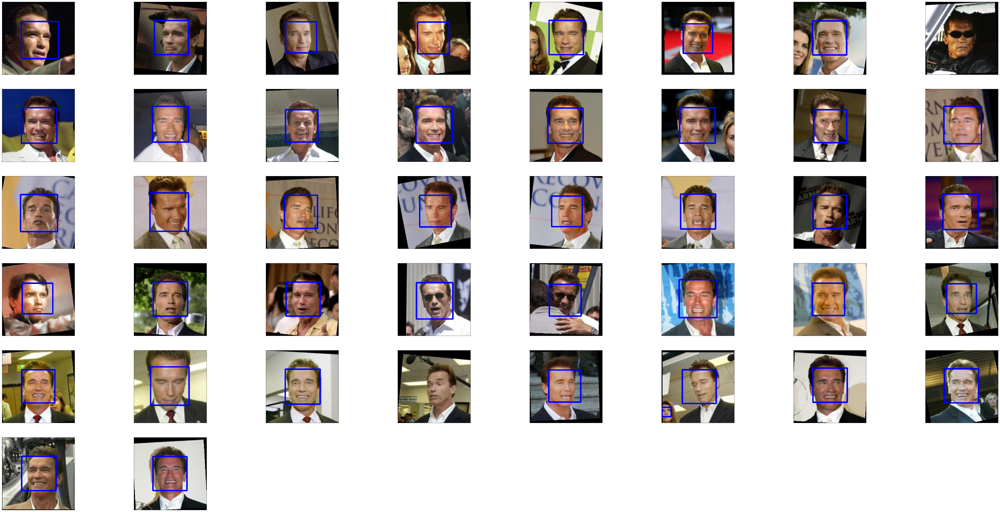

In [18]:
# 簡單測試 OpenCV 抓取臉部的效果

arnold_imgs_path = dataset_path + "Arnold_Schwarzenegger/"
n_images = len(os.listdir(arnold_imgs_path))
# print("Pics in Arnold Schwarzenegger folder: \n", os.listdir(arnold_imgs_path))

plt.figure(figsize = (100, 50))
for idx, image_name in enumerate(os.listdir(arnold_imgs_path)):
    image_path = arnold_imgs_path + image_name
    
    # 從圖片路徑讀取資料
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)     # 因為 OpenCV 讀取影像時是以BGR而非傳統RGB的順序
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 從圖片找出並畫出Bounding Box
    bboxes = detect_faces(image)
    draw_bounding_boxes(image, bboxes)
    
    # 顯示結果
    plt.subplot(int(n_images/8)+1, 8, idx+1)
    plt.subplots_adjust(wspace = 0.1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    
plt.show()

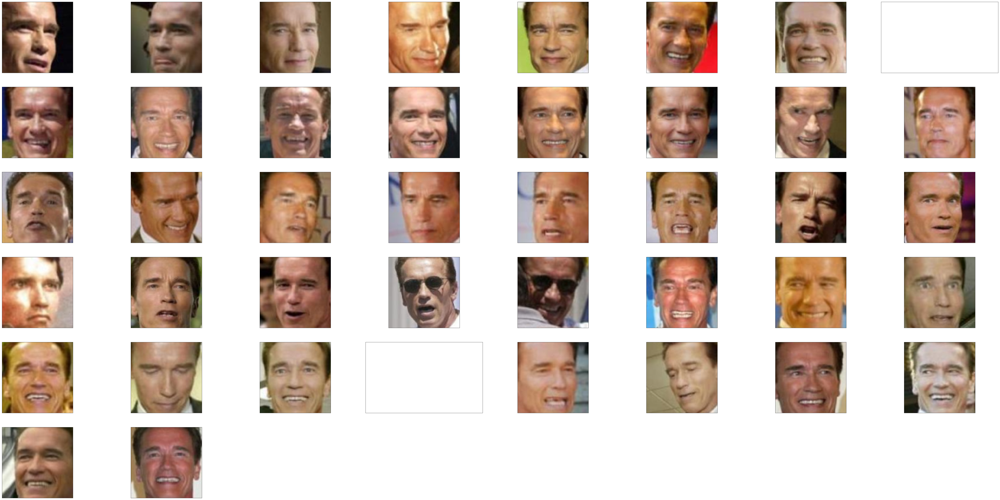

In [19]:
# 簡單測試臉部經過 Crop + Resize 過後的成果

arnold_imgs_path = dataset_path + "Arnold_Schwarzenegger/"
n_images = len(os.listdir(arnold_imgs_path))
# print("Pics in Arnold Schwarzenegger folder: \n", os.listdir(arnold_imgs_path))

plt.figure(figsize = (100, 50))
for idx, image_name in enumerate(os.listdir(arnold_imgs_path)):
    image_path = arnold_imgs_path + image_name
    
    # 從圖片路徑讀取資料
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)     # 因為 OpenCV 讀取影像時是以BGR而非傳統RGB的順序
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 從圖片找出臉孔並做切割
    bboxes = detect_faces(image)
    face_list = crop_resize_faces(image, bboxes)
    
    # 顯示結果
    plt.subplot(int(n_images/8)+1, 8, idx+1)
    plt.subplots_adjust(wspace = 0.1)
    plt.xticks([])
    plt.yticks([])
    for face_image in face_list:
        plt.imshow(face_image)
    
plt.show()

#### 定義Confusion Matrix Function---畫出真實的label和判斷的label數量的Grid

In [61]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_test=None, y_pred=None):
    confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
    fig, ax = plt.subplots(figsize=(5,5))
    ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(confmat.shape[0]):
      for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center')
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.tight_layout()
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(20)
    for item in (ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(15)
    plt.show()

#### 定義Scoring Function---回傳Precision、Recall、F1-Score

In [62]:
from sklearn.metrics import precision_score, recall_score, f1_score

def scoring_matrix(y_test=None, y_pred=None):
    print('[Precision]')
    p = precision_score(y_true=y_test, y_pred=y_pred, average=None)
    print('Individual: %.2f, %.2f, %.2f' % (p[0], p[1], p[2]))
    p = precision_score(y_true=y_test, y_pred=y_pred, average='micro')
    print('Micro: %.2f' % p)
    p = precision_score(y_true=y_test, y_pred=y_pred, average='macro')
    print('Macro: %.2f' % p)

    print('\n[Recall]')
    r = recall_score(y_true=y_test, y_pred=y_pred,average=None)
    print('Individual: %.2f, %.2f, %.2f' % (r[0], r[1], r[2]))
    r = recall_score(y_true=y_test, y_pred=y_pred, average='micro')
    print('Micro: %.2f' % r)
    r = recall_score(y_true=y_test, y_pred=y_pred, average='macro')
    print('Macro: %.2f' % r)

    print('\n[F1-score]')
    f = f1_score(y_true=y_test, y_pred=y_pred, average=None)
    print('Individual: %.2f, %.2f, %.2f' % (f[0], f[1], f[2]))
    f = f1_score(y_true=y_test, y_pred=y_pred, average='micro')
    print('Micro: %.2f' % f)
    f = f1_score(y_true=y_test, y_pred=y_pred, average='macro')
    print('Macro: %.2f' % f)

### 處理csv檔資料 (轉換成可讀路徑)

In [63]:
# 將 lfw_allnames 的資料對應到 jpg 影像

image_paths = my_dataset_allnames.loc[my_dataset_allnames.index.repeat(my_dataset_allnames['images'])]
image_paths['image_path'] = 1 + image_paths.groupby('name').cumcount()
image_paths['image_path'] = image_paths.image_path.apply(lambda x: '{0:0>4}'.format(x))
image_paths['image_path'] = image_paths.name + "/" + image_paths.name + "_" + image_paths.image_path + ".jpg"
image_paths = image_paths.drop("images",1)

print(image_paths)

            name                          image_path
0   Donald Trump  Donald Trump/Donald Trump_0001.jpg
0   Donald Trump  Donald Trump/Donald Trump_0002.jpg
0   Donald Trump  Donald Trump/Donald Trump_0003.jpg
0   Donald Trump  Donald Trump/Donald Trump_0004.jpg
0   Donald Trump  Donald Trump/Donald Trump_0005.jpg
..           ...                                 ...
5        Max_Hsu            Max_Hsu/Max_Hsu_0146.jpg
5        Max_Hsu            Max_Hsu/Max_Hsu_0147.jpg
5        Max_Hsu            Max_Hsu/Max_Hsu_0148.jpg
5        Max_Hsu            Max_Hsu/Max_Hsu_0149.jpg
5        Max_Hsu            Max_Hsu/Max_Hsu_0150.jpg

[685 rows x 2 columns]


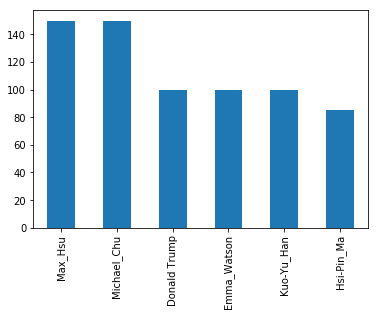

In [64]:
image_paths['name'].value_counts().plot(kind = "bar")

In [65]:
# 避免 Imbalance Data 的影響, 故取中段的人物作為 Training 的資料來源 (大約 40~80 張照片左右)  <- 用於原本的LFW Dataset, 在自製的dataset則不會使用

# start_index = 2   # 從上面圖表看出第六位以後就會低於100張照片了
# num_people = 5   # 要選擇的人物個數

# 前面訓練時把 馬席彬教授 的照片抽掉, 因為前面是用 OpenCV 內建的 Cascade Classifier (效果不好), 多數 馬席彬教授 的照片都無法辨認
# pic_amount = image_paths['name'].value_counts()[:-1]
# 後面用 dlib 去捕捉臉孔效果好很多, 所以就用全部的照片
pic_amount = image_paths['name'].value_counts()

name_labels = pic_amount.index.tolist()

X_paths = pd.Series()
y_pd = pd.Series()
for name in name_labels:
    X_paths = pd.concat([X_paths, image_paths.loc[image_paths['name'] == name]['image_path']], axis=0)
    y_pd = pd.concat([y_pd, pd.Series([name]).repeat(pic_amount[name])], axis=0)

print(y_pd.shape)
print(X_paths.shape)

(685,)
(685,)


### 從路徑讀取照片進來 (100x100)

In [22]:
# 將所有在 X_path 裡面的路徑讀取資料進來

X = np.zeros((1, image_size[0]*image_size[1]))
y = y_pd.values
delete_index = []

for idx, path in enumerate(X_paths.values):
    image_path = my_dataset_path + path
    
    # 從圖片路徑讀取資料
    image = cv2.imread(image_path)
    if(image is not None):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)    # 降成灰階圖減少維度造成的影響

        # 從圖片找出臉孔並做切割
        bboxes = detect_faces(image)
        face_list = crop_resize_faces(image, bboxes)

        # 建立 Training Data 'X' (n_samples(圖片個數), n_features(圖片pixel數)), 以存在一個臉孔為準
        if (len(face_list) == 1):
            X = np.vstack((X, face_list[0].reshape(-1)))
        else:
            delete_index.append(idx)
    else:
        delete_index.append(idx)    # 多出一個臉或是偵測不到臉部的資料都必須去除掉

X = np.delete(X, 0, axis=0)
y = np.delete(y, delete_index, axis=0)
    
print(X.shape)
print(y.shape)

(331, 10000)
(331,)


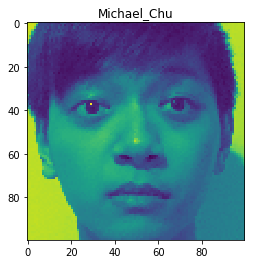

In [23]:
plt.title(y[103])
plt.imshow(X[103].reshape(image_size))

In [24]:
# 將 Dataset 做 Train Test Split

le = LabelEncoder()
y_val = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_val, test_size=0.3, random_state=1, stratify=y_val)
#X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.3, random_state=1, stratify=y_trainval)

sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)

In [25]:
print(X_train.shape)
print(X_test.shape)

(231, 10000)
(100, 10000)


### Picture Visualization with PCA

In [26]:
# 用 PCA 將高維度的圖片做降維的動作

n_components = 150
print("Extracting the top %d eigenfaces from %d faces" % (n_components, X.shape[0]))

pca = PCA(n_components=n_components, svd_solver='randomized', whiten=True)
X_pca = pca.fit_transform(X)

eigenfaces = pca.components_.reshape((n_components, image_size[0], image_size[1]))

Extracting the top 150 eigenfaces from 331 faces


In [27]:
# 讓繪出結果更加方便的函式

def plot_gallery(images, titles, h, w, n_row=3, n_col=4):
    plt.figure(figsize=(1.8 * n_col, 2.4 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

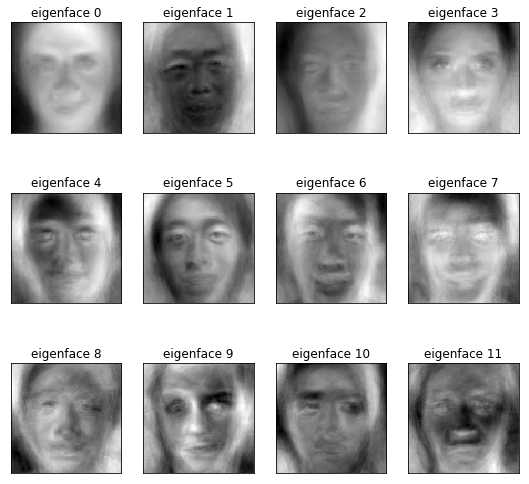

In [28]:
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, image_size[0], image_size[1])
plt.show()

### 第一種方法 (原始圖檔直接做Classifier)

#### SVM

In [39]:
# SVM 不做降維做 GridSearch
from sklearn.externals import joblib

pipe = Pipeline([
    ('SVC', SVC())
])

param_gamma = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1]
param_C = [0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'SVC__C': param_C,
               'SVC__kernel':['rbf','poly'],
               'SVC__gamma': param_gamma}]

grid_svm = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)

grid_svm = grid_svm.fit(X_train_std, y_train)

print(grid_svm.best_score_)
print(grid_svm.best_params_)

0.8744588744588745
{'SVC__kernel': 'rbf', 'SVC__C': 10.0, 'SVC__gamma': 0.0001}


Testing Accuracy:  0.93


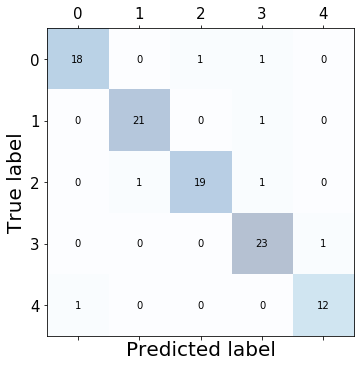

[Precision]
Individual: 0.95, 0.95, 0.95
Micro: 0.93
Macro: 0.93

[Recall]
Individual: 0.90, 0.95, 0.90
Micro: 0.93
Macro: 0.93

[F1-score]
Individual: 0.92, 0.95, 0.93
Micro: 0.93
Macro: 0.93


In [40]:
print("Testing Accuracy: ", grid_svm.score(X_test_std, y_test))

y_pred = grid_svm.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### Random Forest

In [41]:
# Random Forest 不做降維做 GridSearch

pipe = Pipeline([
    ('RF', RandomForestClassifier())
])

param_grid = [{"RF__n_estimators": range(1, 100, 5),
               'RF__criterion': ['gini', 'entropy']}]

grid_rf = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_rf = grid_rf.fit(X_train_std, y_train)

print(grid_rf.best_score_)
print(grid_rf.best_params_)

0.8701298701298701
{'RF__n_estimators': 76, 'RF__criterion': 'gini'}


Testing Accuracy:  0.87


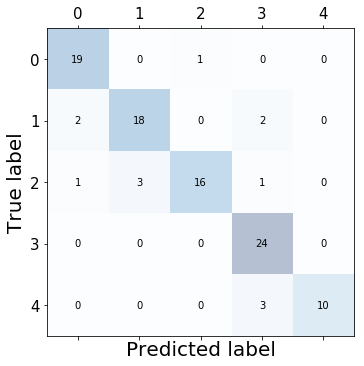

[Precision]
Individual: 0.86, 0.86, 0.94
Micro: 0.87
Macro: 0.89

[Recall]
Individual: 0.95, 0.82, 0.76
Micro: 0.87
Macro: 0.86

[F1-score]
Individual: 0.90, 0.84, 0.84
Micro: 0.87
Macro: 0.87


In [42]:
print("Testing Accuracy: ", grid_rf.score(X_test_std, y_test))

y_pred = grid_rf.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### KNN

In [43]:
# KNN 不做降維做 GridSearch

param_grid = [{'n_neighbors': range(1, 15)}]

knn = KNeighborsClassifier()
grid_knn = GridSearchCV(estimator=knn, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_knn = grid_knn.fit(X_train_std, y_train)

print(grid_knn.best_score_)
print(grid_knn.best_params_)

0.7748917748917749
{'n_neighbors': 5}


Testing Accuracy:  0.85


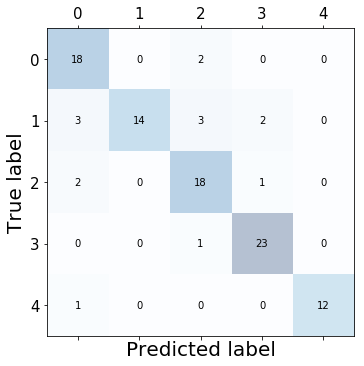

[Precision]
Individual: 0.75, 1.00, 0.75
Micro: 0.85
Macro: 0.88

[Recall]
Individual: 0.90, 0.64, 0.86
Micro: 0.85
Macro: 0.85

[F1-score]
Individual: 0.82, 0.78, 0.80
Micro: 0.85
Macro: 0.86


In [44]:
print("Testing Accuracy: ", grid_knn.score(X_test_std, y_test))

y_pred = grid_knn.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

### 第二類: PCA降維後放入Classifier

#### SVM

In [45]:
# 放入 SVM 去做訓練

pipe = Pipeline([
    ('PCA', PCA()),
    ('SVC', SVC())
])

param_n_components = [10, 30, 50, 70, 100]
param_gamma = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1]
param_C = [0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'PCA__n_components': param_n_components,
               'SVC__C': param_C,
               'SVC__kernel':['rbf','poly'],
               'SVC__gamma': param_gamma}]

grid_svm_pca = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_svm_pca = grid_svm_pca.fit(X_train_std, y_train)

print(grid_svm_pca.best_score_)
print(grid_svm_pca.best_params_)

0.8744588744588745
{'SVC__kernel': 'rbf', 'SVC__C': 10.0, 'PCA__n_components': 30, 'SVC__gamma': 0.0001}


Testing Accuracy:  0.94


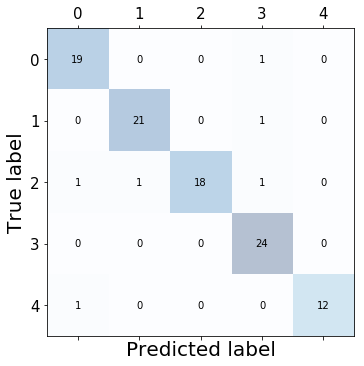

[Precision]
Individual: 0.90, 0.95, 1.00
Micro: 0.94
Macro: 0.95

[Recall]
Individual: 0.95, 0.95, 0.86
Micro: 0.94
Macro: 0.94

[F1-score]
Individual: 0.93, 0.95, 0.92
Micro: 0.94
Macro: 0.94


In [46]:
print("Testing Accuracy: ", grid_svm_pca.score(X_test_std, y_test))
y_pred = grid_svm_pca.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### Random Forest

In [47]:
# 放入 Random Forest 去做訓練

pipe = Pipeline([
    ('PCA', PCA()),
    ('RF', RandomForestClassifier())
])

param_n_components = [10, 30, 50, 70, 100]
param_C = [0.1, 1.0, 10.0, 100.0]
param_grid = [{'PCA__n_components' : param_n_components,
               "RF__n_estimators": range(1, 100, 5),
               'RF__criterion': ['gini', 'entropy']}]

grid_rf_pca = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_rf_pca = grid_rf_pca.fit(X_train_std, y_train)

print(grid_rf_pca.best_score_)
print(grid_rf_pca.best_params_)

0.8917748917748918
{'RF__n_estimators': 71, 'PCA__n_components': 30, 'RF__criterion': 'entropy'}


Testing Accuracy:  0.93


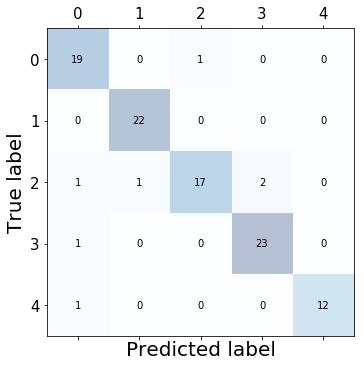

[Precision]
Individual: 0.86, 0.96, 0.94
Micro: 0.93
Macro: 0.94

[Recall]
Individual: 0.95, 1.00, 0.81
Micro: 0.93
Macro: 0.93

[F1-score]
Individual: 0.90, 0.98, 0.87
Micro: 0.93
Macro: 0.93


In [48]:
print("Testing Accuracy: ", grid_rf_pca.score(X_test_std, y_test))

y_pred = grid_rf_pca.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### KNN

In [49]:
# 放入 KNN 去做訓練

pipe = Pipeline([
    ('PCA', PCA()),
    ('KNN', KNeighborsClassifier())
])

param_n_components = [10, 30, 50, 70, 100]
param_grid = [{'PCA__n_components' : param_n_components,
               "KNN__n_neighbors": range(1,15)}]

grid_knn_pca = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_knn_pca = grid_knn_pca.fit(X_train_std, y_train)

print(grid_knn_pca.best_score_)
print(grid_knn_pca.best_params_)

0.7878787878787878
{'PCA__n_components': 30, 'KNN__n_neighbors': 5}


Testing Accuracy:  0.82


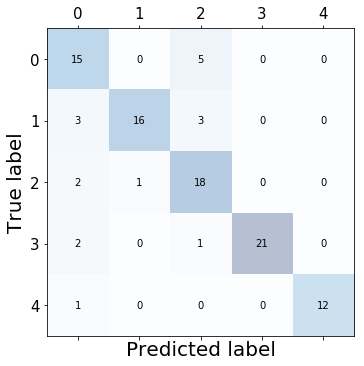

[Precision]
Individual: 0.65, 0.94, 0.67
Micro: 0.82
Macro: 0.85

[Recall]
Individual: 0.75, 0.73, 0.86
Micro: 0.82
Macro: 0.83

[F1-score]
Individual: 0.70, 0.82, 0.75
Micro: 0.82
Macro: 0.83


In [50]:
print("Testing Accuracy: ", grid_knn_pca.score(X_test_std, y_test))

y_pred = grid_knn_pca.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

### 第三類: LDA降維後放入Classifier

#### SVM

In [51]:
# 放入 SVM 去做訓練

pipe = Pipeline([
    ('LDA', LDA()),
    ('SVC', SVC(gamma='auto', kernel='rbf'))
])

param_n_components = [1,2,3,4,5]
param_gamma = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1]
param_C = [0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'LDA__n_components': param_n_components,
               'SVC__C': param_C,
               'SVC__kernel':['rbf','poly'],
               'SVC__gamma': param_gamma}]

grid_svm_lda = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_svm_lda = grid_svm_lda.fit(X_train_std, y_train)

print(grid_svm_lda.best_score_)
print(grid_svm_lda.best_params_)

0.8744588744588745
{'SVC__kernel': 'rbf', 'LDA__n_components': 4, 'SVC__C': 0.1, 'SVC__gamma': 0.01}


Testing Accuracy:  0.86


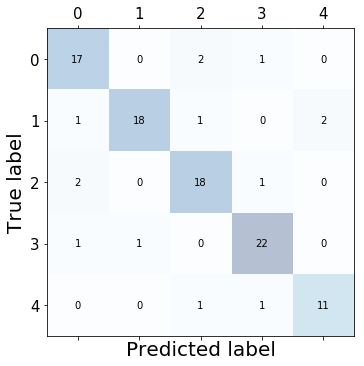

[Precision]
Individual: 0.81, 0.95, 0.82
Micro: 0.86
Macro: 0.86

[Recall]
Individual: 0.85, 0.82, 0.86
Micro: 0.86
Macro: 0.86

[F1-score]
Individual: 0.83, 0.88, 0.84
Micro: 0.86
Macro: 0.86


In [52]:
print("Testing Accuracy: ", grid_svm_lda.score(X_test_std, y_test))

y_pred = grid_svm_lda.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### Random Forest

In [53]:
# 放入 Random Forest 去做訓練

pipe = Pipeline([
    ('LDA', LDA()),
    ('RF', RandomForestClassifier())
])

param_n_components = [1,2,3,4,5]
param_C = [0.1, 1.0, 10.0, 100.0]
param_grid = [{'LDA__n_components' : param_n_components,
               "RF__n_estimators": range(1, 100, 5),
               'RF__criterion': ['gini', 'entropy']}]

grid_rf_lda = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_rf_lda = grid_rf_lda.fit(X_train_std, y_train)

print(grid_rf_lda.best_score_)
print(grid_rf_lda.best_params_)

0.8571428571428571
{'LDA__n_components': 4, 'RF__n_estimators': 26, 'RF__criterion': 'gini'}


Testing Accuracy:  0.82


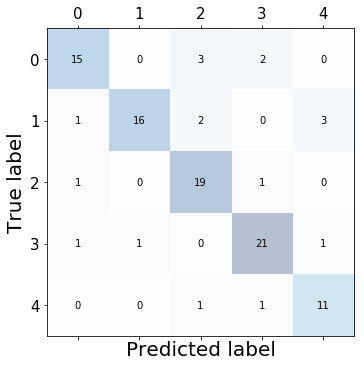

[Precision]
Individual: 0.83, 0.94, 0.76
Micro: 0.82
Macro: 0.82

[Recall]
Individual: 0.75, 0.73, 0.90
Micro: 0.82
Macro: 0.82

[F1-score]
Individual: 0.79, 0.82, 0.83
Micro: 0.82
Macro: 0.82


In [54]:
print("Testing Accuracy: ", grid_rf_lda.score(X_test_std, y_test))

y_pred = grid_rf_lda.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### KNN

In [55]:
# 放入 KNN 去做訓練

pipe = Pipeline([
    ('LDA', LDA()),
    ('KNN', KNeighborsClassifier())
])

param_n_components = [1,2,3,4,5]
param_grid = [{'LDA__n_components' : param_n_components,
               "KNN__n_neighbors": range(1,15)}]

grid_knn_lda = GridSearchCV(estimator=pipe, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_knn_lda = grid_knn_lda.fit(X_train_std, y_train)

print(grid_knn_lda.best_score_)
print(grid_knn_lda.best_params_)

0.8701298701298701
{'LDA__n_components': 4, 'KNN__n_neighbors': 11}


Testing Accuracy:  0.87


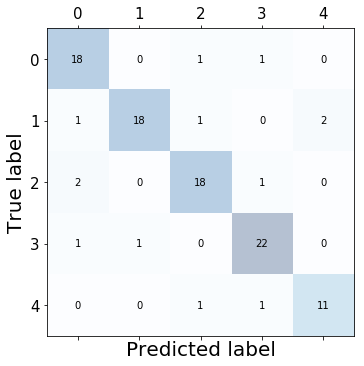

[Precision]
Individual: 0.82, 0.95, 0.86
Micro: 0.87
Macro: 0.87

[Recall]
Individual: 0.90, 0.82, 0.86
Micro: 0.87
Macro: 0.87

[F1-score]
Individual: 0.86, 0.88, 0.86
Micro: 0.87
Macro: 0.87


In [56]:
print("Testing Accuracy: ", grid_knn_lda.score(X_test_std, y_test))

y_pred = grid_knn_lda.predict(X_test_std)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### Save All Models Above

In [57]:
joblib.dump(grid_svm.best_estimator_, './classifiers/svm_CV2.pkl')
joblib.dump(grid_rf.best_estimator_, './classifiers/rf_CV2.pkl')
joblib.dump(grid_knn.best_estimator_, './classifiers/knn_CV2.pkl')

joblib.dump(grid_svm_pca.best_estimator_, './classifiers/svm_pca_CV2.pkl')
joblib.dump(grid_rf_pca.best_estimator_, './classifiers/rf_pca_CV2.pkl')
joblib.dump(grid_knn_pca.best_estimator_, './classifiers/knn_pca_CV2.pkl')

joblib.dump(grid_svm_lda.best_estimator_, './classifiers/svm_lda_CV2.pkl')
joblib.dump(grid_rf_lda.best_estimator_, './classifiers/rf_lda_CV2.pkl')
joblib.dump(grid_knn_lda.best_estimator_, './classifiers/knn_lda_CV2.pkl')

['./Model/knn_lda_CV2.pkl']

### 第四種方法: 用pretrained model壓成embedding後放入Classifier

- #### 用 Pretrained Deep Learning Model 提取特徵
- #### 使用dlib抓取臉孔(臉孔辨識成功率更高) ......  以下為模組測試
- #### 使用OpenFace的FaceAlignment

Found 5 faces in the image file ./test.jpg
- Face #0 found at Left: 572 Top: 125 Right: 662 Bottom: 214
- Face #1 found at Left: 496 Top: 210 Right: 603 Bottom: 317
- Face #2 found at Left: 336 Top: 130 Right: 491 Bottom: 285
- Face #3 found at Left: -21 Top: 281 Right: 122 Bottom: 410
- Face #4 found at Left: 680 Top: 130 Right: 835 Bottom: 285


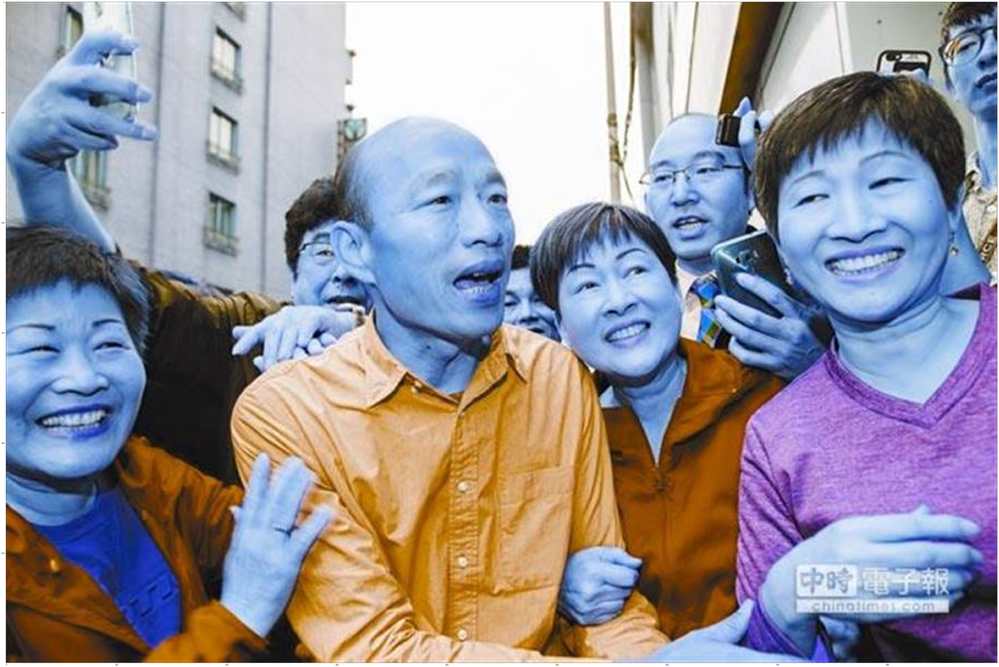

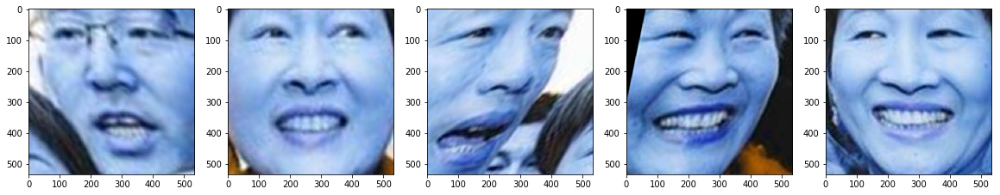

In [26]:
import sys
import dlib
import cv2
import openface

# 測試 dlib 抓取臉孔的效果及 openface 做 Alignment的效果

# You can download the required pre-trained face detection model here:
# http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
predictor_model = "./face predictors/shape_predictor_68_face_landmarks.dat"

# Take the image file name from the command line
file_name = "./test.jpg"

# Create a HOG face detector using the built-in dlib class
face_detector = dlib.get_frontal_face_detector()
face_pose_predictor = dlib.shape_predictor(predictor_model)
face_aligner = openface.AlignDlib(predictor_model)

# Load the image
image = cv2.imread(file_name)

plt.figure(figsize=(100, 100))
plt.imshow(image)

# Run the HOG face detector on the image data
detected_faces = face_detector(image, 1)

print("Found {} faces in the image file {}".format(len(detected_faces), file_name))

plt.figure(figsize=(20, 100))
# Loop through each face we found in the image
for i, face_rect in enumerate(detected_faces):

    # Detected faces are returned as an object with the coordinates 
    # of the top, left, right and bottom edges
    print("- Face #{} found at Left: {} Top: {} Right: {} Bottom: {}".format(i, face_rect.left(), face_rect.top(), face_rect.right(), face_rect.bottom()))

    # Use openface to calculate and perform the face alignment
    alignedFace = face_aligner.align(534, image, face_rect, landmarkIndices=openface.AlignDlib.OUTER_EYES_AND_NOSE)
    
    # Get the the face's pose
    pose_landmarks = face_pose_predictor(alignedFace, face_rect)
    
    plt.subplot(1, 5, i+1)
    plt.imshow(alignedFace)

    # Save the aligned image to a file
    # cv2.imwrite("aligned_face_{}.jpg".format(i), alignedFace)
    

#### Pretrained Model 1 : FaceNet

In [70]:
from functools import partial

from keras.models import Model
from keras.layers import Activation
from keras.layers import BatchNormalization
from keras.layers import Concatenate
from keras.layers import Conv2D
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import GlobalAveragePooling2D
from keras.layers import Input
from keras.layers import Lambda
from keras.layers import MaxPooling2D
from keras.layers import add
from keras import backend as K


def scaling(x, scale):
    return x * scale


def conv2d_bn(x,
              filters,
              kernel_size,
              strides=1,
              padding='same',
              activation='relu',
              use_bias=False,
              name=None):
    x = Conv2D(filters,
               kernel_size,
               strides=strides,
               padding=padding,
               use_bias=use_bias,
               name=name)(x)
    if not use_bias:
        bn_axis = 1 if K.image_data_format() == 'channels_first' else 3
        bn_name = _generate_layer_name('BatchNorm', prefix=name)
        x = BatchNormalization(axis=bn_axis, momentum=0.995, epsilon=0.001,
                               scale=False, name=bn_name)(x)
    if activation is not None:
        ac_name = _generate_layer_name('Activation', prefix=name)
        x = Activation(activation, name=ac_name)(x)
    return x


def _generate_layer_name(name, branch_idx=None, prefix=None):
    if prefix is None:
        return None
    if branch_idx is None:
        return '_'.join((prefix, name))
    return '_'.join((prefix, 'Branch', str(branch_idx), name))


def _inception_resnet_block(x, scale, block_type, block_idx, activation='relu'):
    channel_axis = 1 if K.image_data_format() == 'channels_first' else 3
    if block_idx is None:
        prefix = None
    else:
        prefix = '_'.join((block_type, str(block_idx)))
    name_fmt = partial(_generate_layer_name, prefix=prefix)

    if block_type == 'Block35':
        branch_0 = conv2d_bn(x, 32, 1, name=name_fmt('Conv2d_1x1', 0))
        branch_1 = conv2d_bn(x, 32, 1, name=name_fmt('Conv2d_0a_1x1', 1))
        branch_1 = conv2d_bn(branch_1, 32, 3, name=name_fmt('Conv2d_0b_3x3', 1))
        branch_2 = conv2d_bn(x, 32, 1, name=name_fmt('Conv2d_0a_1x1', 2))
        branch_2 = conv2d_bn(branch_2, 32, 3, name=name_fmt('Conv2d_0b_3x3', 2))
        branch_2 = conv2d_bn(branch_2, 32, 3, name=name_fmt('Conv2d_0c_3x3', 2))
        branches = [branch_0, branch_1, branch_2]
    elif block_type == 'Block17':
        branch_0 = conv2d_bn(x, 128, 1, name=name_fmt('Conv2d_1x1', 0))
        branch_1 = conv2d_bn(x, 128, 1, name=name_fmt('Conv2d_0a_1x1', 1))
        branch_1 = conv2d_bn(branch_1, 128, [1, 7], name=name_fmt('Conv2d_0b_1x7', 1))
        branch_1 = conv2d_bn(branch_1, 128, [7, 1], name=name_fmt('Conv2d_0c_7x1', 1))
        branches = [branch_0, branch_1]
    elif block_type == 'Block8':
        branch_0 = conv2d_bn(x, 192, 1, name=name_fmt('Conv2d_1x1', 0))
        branch_1 = conv2d_bn(x, 192, 1, name=name_fmt('Conv2d_0a_1x1', 1))
        branch_1 = conv2d_bn(branch_1, 192, [1, 3], name=name_fmt('Conv2d_0b_1x3', 1))
        branch_1 = conv2d_bn(branch_1, 192, [3, 1], name=name_fmt('Conv2d_0c_3x1', 1))
        branches = [branch_0, branch_1]
    else:
        raise ValueError('Unknown Inception-ResNet block type. '
                         'Expects "Block35", "Block17" or "Block8", '
                         'but got: ' + str(block_type))

    mixed = Concatenate(axis=channel_axis, name=name_fmt('Concatenate'))(branches)
    up = conv2d_bn(mixed,
                   K.int_shape(x)[channel_axis],
                   1,
                   activation=None,
                   use_bias=True,
                   name=name_fmt('Conv2d_1x1'))
    up = Lambda(scaling,
                output_shape=K.int_shape(up)[1:],
                arguments={'scale': scale})(up)
    x = add([x, up])
    if activation is not None:
        x = Activation(activation, name=name_fmt('Activation'))(x)
    return x


def InceptionResNetV1(input_shape=(160, 160, 3),
                      classes=128,
                      dropout_keep_prob=0.8,
                      weights_path=None):
    inputs = Input(shape=input_shape)
    x = conv2d_bn(inputs, 32, 3, strides=2, padding='valid', name='Conv2d_1a_3x3')
    x = conv2d_bn(x, 32, 3, padding='valid', name='Conv2d_2a_3x3')
    x = conv2d_bn(x, 64, 3, name='Conv2d_2b_3x3')
    x = MaxPooling2D(3, strides=2, name='MaxPool_3a_3x3')(x)
    x = conv2d_bn(x, 80, 1, padding='valid', name='Conv2d_3b_1x1')
    x = conv2d_bn(x, 192, 3, padding='valid', name='Conv2d_4a_3x3')
    x = conv2d_bn(x, 256, 3, strides=2, padding='valid', name='Conv2d_4b_3x3')

    # 5x Block35 (Inception-ResNet-A block):
    for block_idx in range(1, 6):
        x = _inception_resnet_block(x,
                                    scale=0.17,
                                    block_type='Block35',
                                    block_idx=block_idx)

    # Mixed 6a (Reduction-A block):
    channel_axis = 1 if K.image_data_format() == 'channels_first' else 3
    name_fmt = partial(_generate_layer_name, prefix='Mixed_6a')
    branch_0 = conv2d_bn(x,
                         384,
                         3,
                         strides=2,
                         padding='valid',
                         name=name_fmt('Conv2d_1a_3x3', 0))
    branch_1 = conv2d_bn(x, 192, 1, name=name_fmt('Conv2d_0a_1x1', 1))
    branch_1 = conv2d_bn(branch_1, 192, 3, name=name_fmt('Conv2d_0b_3x3', 1))
    branch_1 = conv2d_bn(branch_1,
                         256,
                         3,
                         strides=2,
                         padding='valid',
                         name=name_fmt('Conv2d_1a_3x3', 1))
    branch_pool = MaxPooling2D(3,
                               strides=2,
                               padding='valid',
                               name=name_fmt('MaxPool_1a_3x3', 2))(x)
    branches = [branch_0, branch_1, branch_pool]
    x = Concatenate(axis=channel_axis, name='Mixed_6a')(branches)

    # 10x Block17 (Inception-ResNet-B block):
    for block_idx in range(1, 11):
        x = _inception_resnet_block(x,
                                    scale=0.1,
                                    block_type='Block17',
                                    block_idx=block_idx)

    # Mixed 7a (Reduction-B block): 8 x 8 x 2080
    name_fmt = partial(_generate_layer_name, prefix='Mixed_7a')
    branch_0 = conv2d_bn(x, 256, 1, name=name_fmt('Conv2d_0a_1x1', 0))
    branch_0 = conv2d_bn(branch_0,
                         384,
                         3,
                         strides=2,
                         padding='valid',
                         name=name_fmt('Conv2d_1a_3x3', 0))
    branch_1 = conv2d_bn(x, 256, 1, name=name_fmt('Conv2d_0a_1x1', 1))
    branch_1 = conv2d_bn(branch_1,
                         256,
                         3,
                         strides=2,
                         padding='valid',
                         name=name_fmt('Conv2d_1a_3x3', 1))
    branch_2 = conv2d_bn(x, 256, 1, name=name_fmt('Conv2d_0a_1x1', 2))
    branch_2 = conv2d_bn(branch_2, 256, 3, name=name_fmt('Conv2d_0b_3x3', 2))
    branch_2 = conv2d_bn(branch_2,
                         256,
                         3,
                         strides=2,
                         padding='valid',
                         name=name_fmt('Conv2d_1a_3x3', 2))
    branch_pool = MaxPooling2D(3,
                               strides=2,
                               padding='valid',
                               name=name_fmt('MaxPool_1a_3x3', 3))(x)
    branches = [branch_0, branch_1, branch_2, branch_pool]
    x = Concatenate(axis=channel_axis, name='Mixed_7a')(branches)

    # 5x Block8 (Inception-ResNet-C block):
    for block_idx in range(1, 6):
        x = _inception_resnet_block(x,
                                    scale=0.2,
                                    block_type='Block8',
                                    block_idx=block_idx)
    x = _inception_resnet_block(x,
                                scale=1.,
                                activation=None,
                                block_type='Block8',
                                block_idx=6)

    # Classification block
    x = GlobalAveragePooling2D(name='AvgPool')(x)
    x = Dropout(1.0 - dropout_keep_prob, name='Dropout')(x)
    # Bottleneck
    x = Dense(classes, use_bias=False, name='Bottleneck')(x)
    bn_name = _generate_layer_name('BatchNorm', prefix='Bottleneck')
    x = BatchNormalization(momentum=0.995, epsilon=0.001, scale=False,
                           name=bn_name)(x)

    # Create model
    model = Model(inputs, x, name='inception_resnet_v1')
    if weights_path is not None:
        model.load_weights(weights_path)

    return model

In [71]:
face_model = InceptionResNetV1()
face_model.load_weights('./pretrained models/facenet_keras_weights.h5')

print(face_model.inputs)
print(face_model.outputs)

[<tf.Tensor 'input_2:0' shape=(?, 160, 160, 3) dtype=float32>]
[<tf.Tensor 'Bottleneck_BatchNorm/cond/Merge:0' shape=(?, 128) dtype=float32>]


#### Pretrained Model 2 : OpenFace Model

In [96]:
# -----------------------------------------------------------------------------------------
# Code taken from https://github.com/iwantooxxoox/Keras-OpenFace (with minor modifications)
# -----------------------------------------------------------------------------------------

from keras.layers import Conv2D, ZeroPadding2D, Activation, Input, concatenate
from keras.layers.core import Lambda, Flatten, Dense
from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import MaxPooling2D, AveragePooling2D
from keras.models import Model
from keras import backend as K

import tensorflow as tf
import numpy as np
import os

from numpy import genfromtxt

_FLOATX = 'float32'

def variable(value, dtype=_FLOATX, name=None):
    v = tf.Variable(np.asarray(value, dtype=dtype), name=name)
    _get_session().run(v.initializer)
    return v

def shape(x):
    return x.get_shape()

def square(x):
    return tf.square(x)

def zeros(shape, dtype=_FLOATX, name=None):
    return variable(np.zeros(shape), dtype, name)

'''def concatenate(tensors, axis=-1):
  if axis < 0:
      axis = axis % len(tensors[0].get_shape())
  return tf.concat(axis, tensors)'''

def LRN2D(x):
    return tf.nn.lrn(x, alpha=1e-4, beta=0.75)

def conv2d_bn(
  x,
  layer=None,
  cv1_out=None,
  cv1_filter=(1, 1),
  cv1_strides=(1, 1),
  cv2_out=None,
  cv2_filter=(3, 3),
  cv2_strides=(1, 1),
  padding=None,
):
    num = '' if cv2_out == None else '1'
    tensor = Conv2D(cv1_out, cv1_filter, strides=cv1_strides, name=layer+'_conv'+num)(x)
    tensor = BatchNormalization(axis=3, epsilon=0.00001, name=layer+'_bn'+num)(tensor)
    tensor = Activation('relu')(tensor)
    if padding == None:
        return tensor
    tensor = ZeroPadding2D(padding=padding)(tensor)
    if cv2_out == None:
        return tensor
    tensor = Conv2D(cv2_out, cv2_filter, strides=cv2_strides, name=layer+'_conv'+'2')(tensor)
    tensor = BatchNormalization(axis=3, epsilon=0.00001, name=layer+'_bn'+'2')(tensor)
    tensor = Activation('relu')(tensor)
    return tensor

weights = [
  'conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3',
  'inception_3a_1x1_conv', 'inception_3a_1x1_bn',
  'inception_3a_pool_conv', 'inception_3a_pool_bn',
  'inception_3a_5x5_conv1', 'inception_3a_5x5_conv2', 'inception_3a_5x5_bn1', 'inception_3a_5x5_bn2',
  'inception_3a_3x3_conv1', 'inception_3a_3x3_conv2', 'inception_3a_3x3_bn1', 'inception_3a_3x3_bn2',
  'inception_3b_3x3_conv1', 'inception_3b_3x3_conv2', 'inception_3b_3x3_bn1', 'inception_3b_3x3_bn2',
  'inception_3b_5x5_conv1', 'inception_3b_5x5_conv2', 'inception_3b_5x5_bn1', 'inception_3b_5x5_bn2',
  'inception_3b_pool_conv', 'inception_3b_pool_bn',
  'inception_3b_1x1_conv', 'inception_3b_1x1_bn',
  'inception_3c_3x3_conv1', 'inception_3c_3x3_conv2', 'inception_3c_3x3_bn1', 'inception_3c_3x3_bn2',
  'inception_3c_5x5_conv1', 'inception_3c_5x5_conv2', 'inception_3c_5x5_bn1', 'inception_3c_5x5_bn2',
  'inception_4a_3x3_conv1', 'inception_4a_3x3_conv2', 'inception_4a_3x3_bn1', 'inception_4a_3x3_bn2',
  'inception_4a_5x5_conv1', 'inception_4a_5x5_conv2', 'inception_4a_5x5_bn1', 'inception_4a_5x5_bn2',
  'inception_4a_pool_conv', 'inception_4a_pool_bn',
  'inception_4a_1x1_conv', 'inception_4a_1x1_bn',
  'inception_4e_3x3_conv1', 'inception_4e_3x3_conv2', 'inception_4e_3x3_bn1', 'inception_4e_3x3_bn2',
  'inception_4e_5x5_conv1', 'inception_4e_5x5_conv2', 'inception_4e_5x5_bn1', 'inception_4e_5x5_bn2',
  'inception_5a_3x3_conv1', 'inception_5a_3x3_conv2', 'inception_5a_3x3_bn1', 'inception_5a_3x3_bn2',
  'inception_5a_pool_conv', 'inception_5a_pool_bn',
  'inception_5a_1x1_conv', 'inception_5a_1x1_bn',
  'inception_5b_3x3_conv1', 'inception_5b_3x3_conv2', 'inception_5b_3x3_bn1', 'inception_5b_3x3_bn2',
  'inception_5b_pool_conv', 'inception_5b_pool_bn',
  'inception_5b_1x1_conv', 'inception_5b_1x1_bn',
  'dense_layer'
]

conv_shape = {
  'conv1': [64, 3, 7, 7],
  'conv2': [64, 64, 1, 1],
  'conv3': [192, 64, 3, 3],
  'inception_3a_1x1_conv': [64, 192, 1, 1],
  'inception_3a_pool_conv': [32, 192, 1, 1],
  'inception_3a_5x5_conv1': [16, 192, 1, 1],
  'inception_3a_5x5_conv2': [32, 16, 5, 5],
  'inception_3a_3x3_conv1': [96, 192, 1, 1],
  'inception_3a_3x3_conv2': [128, 96, 3, 3],
  'inception_3b_3x3_conv1': [96, 256, 1, 1],
  'inception_3b_3x3_conv2': [128, 96, 3, 3],
  'inception_3b_5x5_conv1': [32, 256, 1, 1],
  'inception_3b_5x5_conv2': [64, 32, 5, 5],
  'inception_3b_pool_conv': [64, 256, 1, 1],
  'inception_3b_1x1_conv': [64, 256, 1, 1],
  'inception_3c_3x3_conv1': [128, 320, 1, 1],
  'inception_3c_3x3_conv2': [256, 128, 3, 3],
  'inception_3c_5x5_conv1': [32, 320, 1, 1],
  'inception_3c_5x5_conv2': [64, 32, 5, 5],
  'inception_4a_3x3_conv1': [96, 640, 1, 1],
  'inception_4a_3x3_conv2': [192, 96, 3, 3],
  'inception_4a_5x5_conv1': [32, 640, 1, 1,],
  'inception_4a_5x5_conv2': [64, 32, 5, 5],
  'inception_4a_pool_conv': [128, 640, 1, 1],
  'inception_4a_1x1_conv': [256, 640, 1, 1],
  'inception_4e_3x3_conv1': [160, 640, 1, 1],
  'inception_4e_3x3_conv2': [256, 160, 3, 3],
  'inception_4e_5x5_conv1': [64, 640, 1, 1],
  'inception_4e_5x5_conv2': [128, 64, 5, 5],
  'inception_5a_3x3_conv1': [96, 1024, 1, 1],
  'inception_5a_3x3_conv2': [384, 96, 3, 3],
  'inception_5a_pool_conv': [96, 1024, 1, 1],
  'inception_5a_1x1_conv': [256, 1024, 1, 1],
  'inception_5b_3x3_conv1': [96, 736, 1, 1],
  'inception_5b_3x3_conv2': [384, 96, 3, 3],
  'inception_5b_pool_conv': [96, 736, 1, 1],
  'inception_5b_1x1_conv': [256, 736, 1, 1],
}

def load_weights():
    weightsDir = './weights'
    fileNames = filter(lambda f: not f.startswith('.'), os.listdir(weightsDir))
    paths = {}
    weights_dict = {}

    for n in fileNames:
        paths[n.replace('.csv', '')] = weightsDir + '/' + n

    for name in weights:
        if 'conv' in name:
            conv_w = genfromtxt(paths[name + '_w'], delimiter=',', dtype=None)
            conv_w = np.reshape(conv_w, conv_shape[name])
            conv_w = np.transpose(conv_w, (2, 3, 1, 0))
            conv_b = genfromtxt(paths[name + '_b'], delimiter=',', dtype=None)
            weights_dict[name] = [conv_w, conv_b]     
        elif 'bn' in name:
            bn_w = genfromtxt(paths[name + '_w'], delimiter=',', dtype=None)
            bn_b = genfromtxt(paths[name + '_b'], delimiter=',', dtype=None)
            bn_m = genfromtxt(paths[name + '_m'], delimiter=',', dtype=None)
            bn_v = genfromtxt(paths[name + '_v'], delimiter=',', dtype=None)
            weights_dict[name] = [bn_w, bn_b, bn_m, bn_v]
        elif 'dense' in name:
            dense_w = genfromtxt(weightsDir+'/dense_w.csv', delimiter=',', dtype=None)
            dense_w = np.reshape(dense_w, (128, 736))
            dense_w = np.transpose(dense_w, (1, 0))
            dense_b = genfromtxt(weightsDir+'/dense_b.csv', delimiter=',', dtype=None)
            weights_dict[name] = [dense_w, dense_b]

    return weights_dict

def create_model():
    myInput = Input(shape=(96, 96, 3))

    x = ZeroPadding2D(padding=(3, 3), input_shape=(96, 96, 3))(myInput)
    x = Conv2D(64, (7, 7), strides=(2, 2), name='conv1')(x)
    x = BatchNormalization(axis=3, epsilon=0.00001, name='bn1')(x)
    x = Activation('relu')(x)
    x = ZeroPadding2D(padding=(1, 1))(x)
    x = MaxPooling2D(pool_size=3, strides=2)(x)
    x = Lambda(LRN2D, name='lrn_1')(x)
    x = Conv2D(64, (1, 1), name='conv2')(x)
    x = BatchNormalization(axis=3, epsilon=0.00001, name='bn2')(x)
    x = Activation('relu')(x)
    x = ZeroPadding2D(padding=(1, 1))(x)
    x = Conv2D(192, (3, 3), name='conv3')(x)
    x = BatchNormalization(axis=3, epsilon=0.00001, name='bn3')(x)
    x = Activation('relu')(x)
    x = Lambda(LRN2D, name='lrn_2')(x)
    x = ZeroPadding2D(padding=(1, 1))(x)
    x = MaxPooling2D(pool_size=3, strides=2)(x)

    # Inception3a
    inception_3a_3x3 = Conv2D(96, (1, 1), name='inception_3a_3x3_conv1')(x)
    inception_3a_3x3 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3a_3x3_bn1')(inception_3a_3x3)
    inception_3a_3x3 = Activation('relu')(inception_3a_3x3)
    inception_3a_3x3 = ZeroPadding2D(padding=(1, 1))(inception_3a_3x3)
    inception_3a_3x3 = Conv2D(128, (3, 3), name='inception_3a_3x3_conv2')(inception_3a_3x3)
    inception_3a_3x3 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3a_3x3_bn2')(inception_3a_3x3)
    inception_3a_3x3 = Activation('relu')(inception_3a_3x3)

    inception_3a_5x5 = Conv2D(16, (1, 1), name='inception_3a_5x5_conv1')(x)
    inception_3a_5x5 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3a_5x5_bn1')(inception_3a_5x5)
    inception_3a_5x5 = Activation('relu')(inception_3a_5x5)
    inception_3a_5x5 = ZeroPadding2D(padding=(2, 2))(inception_3a_5x5)
    inception_3a_5x5 = Conv2D(32, (5, 5), name='inception_3a_5x5_conv2')(inception_3a_5x5)
    inception_3a_5x5 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3a_5x5_bn2')(inception_3a_5x5)
    inception_3a_5x5 = Activation('relu')(inception_3a_5x5)

    inception_3a_pool = MaxPooling2D(pool_size=3, strides=2)(x)
    inception_3a_pool = Conv2D(32, (1, 1), name='inception_3a_pool_conv')(inception_3a_pool)
    inception_3a_pool = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3a_pool_bn')(inception_3a_pool)
    inception_3a_pool = Activation('relu')(inception_3a_pool)
    inception_3a_pool = ZeroPadding2D(padding=((3, 4), (3, 4)))(inception_3a_pool)

    inception_3a_1x1 = Conv2D(64, (1, 1), name='inception_3a_1x1_conv')(x)
    inception_3a_1x1 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3a_1x1_bn')(inception_3a_1x1)
    inception_3a_1x1 = Activation('relu')(inception_3a_1x1)

    inception_3a = concatenate([inception_3a_3x3, inception_3a_5x5, inception_3a_pool, inception_3a_1x1], axis=3)

    # Inception3b
    inception_3b_3x3 = Conv2D(96, (1, 1), name='inception_3b_3x3_conv1')(inception_3a)
    inception_3b_3x3 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3b_3x3_bn1')(inception_3b_3x3)
    inception_3b_3x3 = Activation('relu')(inception_3b_3x3)
    inception_3b_3x3 = ZeroPadding2D(padding=(1, 1))(inception_3b_3x3)
    inception_3b_3x3 = Conv2D(128, (3, 3), name='inception_3b_3x3_conv2')(inception_3b_3x3)
    inception_3b_3x3 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3b_3x3_bn2')(inception_3b_3x3)
    inception_3b_3x3 = Activation('relu')(inception_3b_3x3)

    inception_3b_5x5 = Conv2D(32, (1, 1), name='inception_3b_5x5_conv1')(inception_3a)
    inception_3b_5x5 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3b_5x5_bn1')(inception_3b_5x5)
    inception_3b_5x5 = Activation('relu')(inception_3b_5x5)
    inception_3b_5x5 = ZeroPadding2D(padding=(2, 2))(inception_3b_5x5)
    inception_3b_5x5 = Conv2D(64, (5, 5), name='inception_3b_5x5_conv2')(inception_3b_5x5)
    inception_3b_5x5 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3b_5x5_bn2')(inception_3b_5x5)
    inception_3b_5x5 = Activation('relu')(inception_3b_5x5)

    inception_3b_pool = AveragePooling2D(pool_size=(3, 3), strides=(3, 3))(inception_3a)
    inception_3b_pool = Conv2D(64, (1, 1), name='inception_3b_pool_conv')(inception_3b_pool)
    inception_3b_pool = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3b_pool_bn')(inception_3b_pool)
    inception_3b_pool = Activation('relu')(inception_3b_pool)
    inception_3b_pool = ZeroPadding2D(padding=(4, 4))(inception_3b_pool)

    inception_3b_1x1 = Conv2D(64, (1, 1), name='inception_3b_1x1_conv')(inception_3a)
    inception_3b_1x1 = BatchNormalization(axis=3, epsilon=0.00001, name='inception_3b_1x1_bn')(inception_3b_1x1)
    inception_3b_1x1 = Activation('relu')(inception_3b_1x1)

    inception_3b = concatenate([inception_3b_3x3, inception_3b_5x5, inception_3b_pool, inception_3b_1x1], axis=3)

    # Inception3c
    inception_3c_3x3 = conv2d_bn(inception_3b,
                                        layer='inception_3c_3x3',
                                        cv1_out=128,
                                        cv1_filter=(1, 1),
                                        cv2_out=256,
                                        cv2_filter=(3, 3),
                                        cv2_strides=(2, 2),
                                        padding=(1, 1))

    inception_3c_5x5 = conv2d_bn(inception_3b,
                                        layer='inception_3c_5x5',
                                        cv1_out=32,
                                        cv1_filter=(1, 1),
                                        cv2_out=64,
                                        cv2_filter=(5, 5),
                                        cv2_strides=(2, 2),
                                        padding=(2, 2))

    inception_3c_pool = MaxPooling2D(pool_size=3, strides=2)(inception_3b)
    inception_3c_pool = ZeroPadding2D(padding=((0, 1), (0, 1)))(inception_3c_pool)

    inception_3c = concatenate([inception_3c_3x3, inception_3c_5x5, inception_3c_pool], axis=3)

    #inception 4a
    inception_4a_3x3 = conv2d_bn(inception_3c,
                                        layer='inception_4a_3x3',
                                        cv1_out=96,
                                        cv1_filter=(1, 1),
                                        cv2_out=192,
                                        cv2_filter=(3, 3),
                                        cv2_strides=(1, 1),
                                        padding=(1, 1))
    inception_4a_5x5 = conv2d_bn(inception_3c,
                                        layer='inception_4a_5x5',
                                        cv1_out=32,
                                        cv1_filter=(1, 1),
                                        cv2_out=64,
                                        cv2_filter=(5, 5),
                                        cv2_strides=(1, 1),
                                        padding=(2, 2))

    inception_4a_pool = AveragePooling2D(pool_size=(3, 3), strides=(3, 3))(inception_3c)
    inception_4a_pool = conv2d_bn(inception_4a_pool,
                                        layer='inception_4a_pool',
                                        cv1_out=128,
                                        cv1_filter=(1, 1),
                                        padding=(2, 2))
    inception_4a_1x1 = conv2d_bn(inception_3c,
                                        layer='inception_4a_1x1',
                                        cv1_out=256,
                                        cv1_filter=(1, 1))
    inception_4a = concatenate([inception_4a_3x3, inception_4a_5x5, inception_4a_pool, inception_4a_1x1], axis=3)

    #inception4e
    inception_4e_3x3 = conv2d_bn(inception_4a,
                                        layer='inception_4e_3x3',
                                        cv1_out=160,
                                        cv1_filter=(1, 1),
                                        cv2_out=256,
                                        cv2_filter=(3, 3),
                                        cv2_strides=(2, 2),
                                        padding=(1, 1))
    inception_4e_5x5 = conv2d_bn(inception_4a,
                                        layer='inception_4e_5x5',
                                        cv1_out=64,
                                        cv1_filter=(1, 1),
                                        cv2_out=128,
                                        cv2_filter=(5, 5),
                                        cv2_strides=(2, 2),
                                        padding=(2, 2))
    inception_4e_pool = MaxPooling2D(pool_size=3, strides=2)(inception_4a)
    inception_4e_pool = ZeroPadding2D(padding=((0, 1), (0, 1)))(inception_4e_pool)

    inception_4e = concatenate([inception_4e_3x3, inception_4e_5x5, inception_4e_pool], axis=3)

    #inception5a
    inception_5a_3x3 = conv2d_bn(inception_4e,
                                        layer='inception_5a_3x3',
                                        cv1_out=96,
                                        cv1_filter=(1, 1),
                                        cv2_out=384,
                                        cv2_filter=(3, 3),
                                        cv2_strides=(1, 1),
                                        padding=(1, 1))

    inception_5a_pool = AveragePooling2D(pool_size=(3, 3), strides=(3, 3))(inception_4e)
    inception_5a_pool = conv2d_bn(inception_5a_pool,
                                        layer='inception_5a_pool',
                                        cv1_out=96,
                                        cv1_filter=(1, 1),
                                        padding=(1, 1))
    inception_5a_1x1 = conv2d_bn(inception_4e,
                                        layer='inception_5a_1x1',
                                        cv1_out=256,
                                        cv1_filter=(1, 1))

    inception_5a = concatenate([inception_5a_3x3, inception_5a_pool, inception_5a_1x1], axis=3)

    #inception_5b
    inception_5b_3x3 = conv2d_bn(inception_5a,
                                        layer='inception_5b_3x3',
                                        cv1_out=96,
                                        cv1_filter=(1, 1),
                                        cv2_out=384,
                                        cv2_filter=(3, 3),
                                        cv2_strides=(1, 1),
                                        padding=(1, 1))
    inception_5b_pool = MaxPooling2D(pool_size=3, strides=2)(inception_5a)
    inception_5b_pool = conv2d_bn(inception_5b_pool,
                                        layer='inception_5b_pool',
                                        cv1_out=96,
                                        cv1_filter=(1, 1))
    inception_5b_pool = ZeroPadding2D(padding=(1, 1))(inception_5b_pool)

    inception_5b_1x1 = conv2d_bn(inception_5a,
                                        layer='inception_5b_1x1',
                                        cv1_out=256,
                                        cv1_filter=(1, 1))
    inception_5b = concatenate([inception_5b_3x3, inception_5b_pool, inception_5b_1x1], axis=3)

    av_pool = AveragePooling2D(pool_size=(3, 3), strides=(1, 1))(inception_5b)
    reshape_layer = Flatten()(av_pool)
    dense_layer = Dense(128, name='dense_layer')(reshape_layer)
    norm_layer = Lambda(lambda  x: K.l2_normalize(x, axis=1), name='norm_layer')(dense_layer)

    return Model(inputs=[myInput], outputs=norm_layer)


In [59]:
openface_model = create_model()
openface_model.load_weights('./pretrained models/nn4.small2.v1.h5')

print(openface_model.inputs)
print(openface_model.outputs)

[<tf.Tensor 'input_1:0' shape=(?, 96, 96, 3) dtype=float32>]
[<tf.Tensor 'norm_layer/l2_normalize:0' shape=(?, 128) dtype=float32>]


### Function to generate image embedding

In [60]:
def image_embedding(network, image_size):

    # 將所有在 X_path 裡的照片路徑讀取照片進來, 做Alignment過後壓成 128維 的特徵向量

    predictor_model = "./face predictors/shape_predictor_68_face_landmarks.dat"
    # recognizer_model = "dlib_face_recognition_resnet_model_v1"

    face_detector = dlib.get_frontal_face_detector()                      # 抓出臉孔
    face_pose_predictor = dlib.shape_predictor(predictor_model)           # 抓出臉孔輪廓
    face_aligner = openface.AlignDlib(predictor_model)                    # 將臉孔輪廓對齊
    # face_recognizer = dlib.face_recognition_model_v1(recognizer_model)    # 壓縮臉孔成128維向量

    X = np.zeros((1, 128))
    y = y_pd.values
    delete_index = []

    for idx, path in enumerate(X_paths.values):
        print(path)
            
        image_path = my_dataset_path + path

        # 從圖片路徑讀取資料
        image = cv2.imread(image_path)
        
        if (image is not None):
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)     # 因為 OpenCV 讀取影像時是以BGR而非傳統RGB的順序

            # 用 face_detector 去找出臉孔位置及特徵
            detected_faces = face_detector(image, 1)

            # 只取用含有1個臉孔的資料
            if (len(detected_faces) == 1):
                face_rect = detected_faces[0]
                pose_landmarks = face_pose_predictor(image, face_rect)
                alignedFace = face_aligner.align(image_size, image, face_rect, landmarkIndices=openface.AlignDlib.OUTER_EYES_AND_NOSE)
                norm_alignedFace = cv2.normalize(alignedFace, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
                norm_alignedFace = norm_alignedFace[np.newaxis]
                face_description = network.predict(norm_alignedFace)
                X = np.vstack((X, face_description.reshape(1, -1)))
            else:
                delete_index.append(idx)    # 多出一個臉的資料必須去除掉
        else:
            print("failed")
            delete_index.append(idx)    # 多偵測不到臉部的資料必須去除掉

    X = np.delete(X, 0, axis=0)
    y = np.delete(y, delete_index, axis=0)

    return X, y

In [17]:
print(X_paths.shape)

(685,)


#### FaceNet Image Embedding

In [18]:
X_facenet, y_facenet = image_embedding(face_model, 160)

print(X_facenet.shape)
print(y_facenet.shape)

Max_Hsu/Max_Hsu_0001.jpg
Max_Hsu/Max_Hsu_0002.jpg
Max_Hsu/Max_Hsu_0003.jpg
Max_Hsu/Max_Hsu_0004.jpg
Max_Hsu/Max_Hsu_0005.jpg
Max_Hsu/Max_Hsu_0006.jpg
Max_Hsu/Max_Hsu_0007.jpg
Max_Hsu/Max_Hsu_0008.jpg
Max_Hsu/Max_Hsu_0009.jpg
Max_Hsu/Max_Hsu_0010.jpg
Max_Hsu/Max_Hsu_0011.jpg
Max_Hsu/Max_Hsu_0012.jpg
Max_Hsu/Max_Hsu_0013.jpg
Max_Hsu/Max_Hsu_0014.jpg
Max_Hsu/Max_Hsu_0015.jpg
Max_Hsu/Max_Hsu_0016.jpg
Max_Hsu/Max_Hsu_0017.jpg
Max_Hsu/Max_Hsu_0018.jpg
Max_Hsu/Max_Hsu_0019.jpg
Max_Hsu/Max_Hsu_0020.jpg
Max_Hsu/Max_Hsu_0021.jpg
Max_Hsu/Max_Hsu_0022.jpg
Max_Hsu/Max_Hsu_0023.jpg
Max_Hsu/Max_Hsu_0024.jpg
Max_Hsu/Max_Hsu_0025.jpg
Max_Hsu/Max_Hsu_0026.jpg
Max_Hsu/Max_Hsu_0027.jpg
Max_Hsu/Max_Hsu_0028.jpg
Max_Hsu/Max_Hsu_0029.jpg
Max_Hsu/Max_Hsu_0030.jpg
Max_Hsu/Max_Hsu_0031.jpg
Max_Hsu/Max_Hsu_0032.jpg
Max_Hsu/Max_Hsu_0033.jpg
Max_Hsu/Max_Hsu_0034.jpg
Max_Hsu/Max_Hsu_0035.jpg
Max_Hsu/Max_Hsu_0036.jpg
Max_Hsu/Max_Hsu_0037.jpg
Max_Hsu/Max_Hsu_0038.jpg
Max_Hsu/Max_Hsu_0039.jpg
Max_Hsu/Max_Hsu_0040.jpg


Michael_Chu/Michael_Chu_0136.jpg
Michael_Chu/Michael_Chu_0137.jpg
Michael_Chu/Michael_Chu_0138.jpg
Michael_Chu/Michael_Chu_0139.jpg
Michael_Chu/Michael_Chu_0140.jpg
Michael_Chu/Michael_Chu_0141.jpg
Michael_Chu/Michael_Chu_0142.jpg
Michael_Chu/Michael_Chu_0143.jpg
Michael_Chu/Michael_Chu_0144.jpg
Michael_Chu/Michael_Chu_0145.jpg
Michael_Chu/Michael_Chu_0146.jpg
Michael_Chu/Michael_Chu_0147.jpg
Michael_Chu/Michael_Chu_0148.jpg
Michael_Chu/Michael_Chu_0149.jpg
Michael_Chu/Michael_Chu_0150.jpg
Emma_Watson/Emma_Watson_0001.jpg
Emma_Watson/Emma_Watson_0002.jpg
Emma_Watson/Emma_Watson_0003.jpg
Emma_Watson/Emma_Watson_0004.jpg
Emma_Watson/Emma_Watson_0005.jpg
Emma_Watson/Emma_Watson_0006.jpg
Emma_Watson/Emma_Watson_0007.jpg
Emma_Watson/Emma_Watson_0008.jpg
Emma_Watson/Emma_Watson_0009.jpg
Emma_Watson/Emma_Watson_0010.jpg
Emma_Watson/Emma_Watson_0011.jpg
Emma_Watson/Emma_Watson_0012.jpg
Emma_Watson/Emma_Watson_0013.jpg
failed
Emma_Watson/Emma_Watson_0014.jpg
Emma_Watson/Emma_Watson_0015.jpg
Emm

Kuo-Yu_Han/Kuo-Yu_Han_0030.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0031.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0032.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0033.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0034.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0035.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0036.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0037.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0038.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0039.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0040.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0041.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0042.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0043.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0044.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0045.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0046.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0047.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0048.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0049.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0050.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0051.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0052.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0053.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0054.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0055.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0056.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0057.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0058.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0059.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0060.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0061.jpg
Kuo-Yu_H

#### 將FaceNet Embedding資料存起來

In [19]:
np.savetxt("./embeddings/6_people_embedding_facenet_norm.csv", X_facenet, delimiter=",")
np.savetxt("./embeddings/6_people_label_facenet_norm.csv", y_facenet.reshape(-1, 1), delimiter=",", fmt="%s")

#### OpenFace Image Embedding

In [24]:
X_openface, y_openface = image_embedding(openface_model, 96)

print(X_openface.shape)
print(y_openface.shape)

Max_Hsu/Max_Hsu_0001.jpg
Max_Hsu/Max_Hsu_0002.jpg
Max_Hsu/Max_Hsu_0003.jpg
Max_Hsu/Max_Hsu_0004.jpg
Max_Hsu/Max_Hsu_0005.jpg
Max_Hsu/Max_Hsu_0006.jpg
Max_Hsu/Max_Hsu_0007.jpg
Max_Hsu/Max_Hsu_0008.jpg
Max_Hsu/Max_Hsu_0009.jpg
Max_Hsu/Max_Hsu_0010.jpg
Max_Hsu/Max_Hsu_0011.jpg
Max_Hsu/Max_Hsu_0012.jpg
Max_Hsu/Max_Hsu_0013.jpg
Max_Hsu/Max_Hsu_0014.jpg
Max_Hsu/Max_Hsu_0015.jpg
Max_Hsu/Max_Hsu_0016.jpg
Max_Hsu/Max_Hsu_0017.jpg
Max_Hsu/Max_Hsu_0018.jpg
Max_Hsu/Max_Hsu_0019.jpg
Max_Hsu/Max_Hsu_0020.jpg
Max_Hsu/Max_Hsu_0021.jpg
Max_Hsu/Max_Hsu_0022.jpg
Max_Hsu/Max_Hsu_0023.jpg
Max_Hsu/Max_Hsu_0024.jpg
Max_Hsu/Max_Hsu_0025.jpg
Max_Hsu/Max_Hsu_0026.jpg
Max_Hsu/Max_Hsu_0027.jpg
Max_Hsu/Max_Hsu_0028.jpg
Max_Hsu/Max_Hsu_0029.jpg
Max_Hsu/Max_Hsu_0030.jpg
Max_Hsu/Max_Hsu_0031.jpg
Max_Hsu/Max_Hsu_0032.jpg
Max_Hsu/Max_Hsu_0033.jpg
Max_Hsu/Max_Hsu_0034.jpg
Max_Hsu/Max_Hsu_0035.jpg
Max_Hsu/Max_Hsu_0036.jpg
Max_Hsu/Max_Hsu_0037.jpg
Max_Hsu/Max_Hsu_0038.jpg
Max_Hsu/Max_Hsu_0039.jpg
Max_Hsu/Max_Hsu_0040.jpg


Michael_Chu/Michael_Chu_0136.jpg
Michael_Chu/Michael_Chu_0137.jpg
Michael_Chu/Michael_Chu_0138.jpg
Michael_Chu/Michael_Chu_0139.jpg
Michael_Chu/Michael_Chu_0140.jpg
Michael_Chu/Michael_Chu_0141.jpg
Michael_Chu/Michael_Chu_0142.jpg
Michael_Chu/Michael_Chu_0143.jpg
Michael_Chu/Michael_Chu_0144.jpg
Michael_Chu/Michael_Chu_0145.jpg
Michael_Chu/Michael_Chu_0146.jpg
Michael_Chu/Michael_Chu_0147.jpg
Michael_Chu/Michael_Chu_0148.jpg
Michael_Chu/Michael_Chu_0149.jpg
Michael_Chu/Michael_Chu_0150.jpg
Emma_Watson/Emma_Watson_0001.jpg
Emma_Watson/Emma_Watson_0002.jpg
Emma_Watson/Emma_Watson_0003.jpg
Emma_Watson/Emma_Watson_0004.jpg
Emma_Watson/Emma_Watson_0005.jpg
Emma_Watson/Emma_Watson_0006.jpg
Emma_Watson/Emma_Watson_0007.jpg
Emma_Watson/Emma_Watson_0008.jpg
Emma_Watson/Emma_Watson_0009.jpg
Emma_Watson/Emma_Watson_0010.jpg
Emma_Watson/Emma_Watson_0011.jpg
Emma_Watson/Emma_Watson_0012.jpg
Emma_Watson/Emma_Watson_0013.jpg
failed
Emma_Watson/Emma_Watson_0014.jpg
Emma_Watson/Emma_Watson_0015.jpg
Emm

Kuo-Yu_Han/Kuo-Yu_Han_0030.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0031.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0032.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0033.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0034.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0035.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0036.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0037.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0038.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0039.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0040.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0041.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0042.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0043.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0044.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0045.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0046.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0047.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0048.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0049.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0050.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0051.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0052.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0053.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0054.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0055.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0056.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0057.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0058.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0059.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0060.jpg
Kuo-Yu_Han/Kuo-Yu_Han_0061.jpg
Kuo-Yu_H

#### 將OpenFace Embedding資料存起來

In [25]:
np.savetxt("./embeddings/6_people_embedding_openface_norm.csv", X_openface, delimiter=",")
np.savetxt("./embeddings/6_people_label_openface_norm.csv", y_openface.reshape(-1, 1), delimiter=",", fmt="%s")

#### 讀取已經轉換好的embedding

In [66]:
X_facenet = pd.read_csv('./embeddings/6_people_embedding_facenet_norm.csv', delimiter=',', header=None)
y_facenet = pd.read_csv('./embeddings/6_people_label_facenet_norm.csv', header=None)
X_openface = pd.read_csv('./embeddings/6_people_embedding_openface_norm.csv', delimiter=',', header=None)
y_openface = pd.read_csv('./embeddings/6_people_label_openface_norm.csv', header=None)

#X_facenet = np.genfromtxt('./embeddings/5_people_embedding_facenet.csv', delimiter=',')
#y_facenet = np.genfromtxt('./embeddings/5_people_label_facenet.csv', delimiter=',')
#X_openface = np.genfromtxt('./embeddings/5_people_embedding_openface.csv', delimiter=',')
#y_openface = np.genfromtxt('./embeddings/5_people_label_openface.csv', delimiter=',')

In [67]:
print(X_facenet.shape)
print(y_facenet.shape)
print(X_openface.shape)
print(y_openface.shape)

(656, 128)
(656, 1)
(656, 128)
(656, 1)


#### Visualize 2 embedding method

Text(0.5, 1.0, 'OpenFace Embedding')

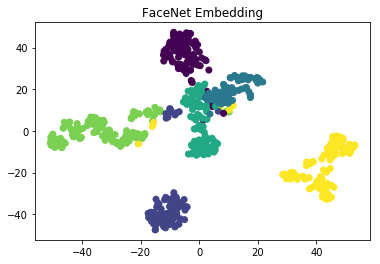

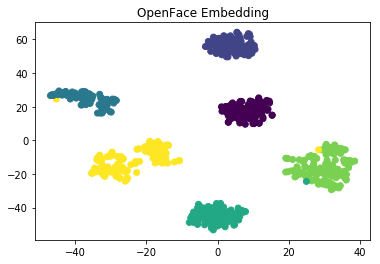

In [68]:
from sklearn.manifold import TSNE

y_facenet_encode = LabelEncoder().fit_transform(y_facenet)
y_openface_encode = LabelEncoder().fit_transform(y_openface)

plt.figure()
X_fn_tsne = TSNE(n_components=2, perplexity=20, early_exaggeration=3).fit_transform(X_facenet)
plt.scatter(X_fn_tsne[:, 0], X_fn_tsne[:, 1], c=y_facenet_encode)
plt.title("FaceNet Embedding")

plt.figure()
X_of_tsne = TSNE(n_components=2, perplexity=20, early_exaggeration=3).fit_transform(X_openface)
plt.scatter(X_of_tsne[:, 0], X_of_tsne[:, 1], c=y_openface_encode)
plt.title("OpenFace Embedding")

#### 後面會用到的一些工具

In [69]:
predictor_model = "./face predictors/shape_predictor_68_face_landmarks.dat"

face_detector = dlib.get_frontal_face_detector()                      # 抓出臉孔
face_pose_predictor = dlib.shape_predictor(predictor_model)           # 抓出臉孔輪廓
face_aligner = openface.AlignDlib(predictor_model)                    # 將臉孔輪廓對齊

#### 輸入一張圖片測試 Model 結果

In [30]:
def image_test(network, image_size, classifier):
    plt.figure(figsize=(100, 50))
    for i in range(1):
        image_path = 'test' + str(i) + '.jpg'

        # 從圖片路徑讀取資料
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)     # 因為 OpenCV 讀取影像時是以BGR而非傳統RGB的順序

        plt.subplot(5, 1, i+1)
        plt.imshow(image)

        # 用 face_detector 去找出臉孔位置及特徵
        detected_faces = face_detector(image, 1)

        # 只取用含有1個臉孔的資料
        if (len(detected_faces) == 1):
            face_rect = detected_faces[0]
            pose_landmarks = face_pose_predictor(image, face_rect)
            alignedFace = face_aligner.align(image_size, image, face_rect, landmarkIndices=openface.AlignDlib.OUTER_EYES_AND_NOSE)
            norm_alignedFace = cv2.normalize(alignedFace, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
            norm_alignedFace = norm_alignedFace[np.newaxis]
            face_description = network.predict(norm_alignedFace)

            y_out = classifier.predict(face_description)
            predict_name = le.inverse_transform([y_out])
            plt.title(predict_name)

## 選擇使用 FaceNet Embedding

In [72]:
X = X_facenet
y = y_facenet

le = LabelEncoder()
y_val = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_val, test_size=0.1, random_state=1, stratify=y_val)

joblib.dump(le, './classifiers/label_encoder.pkl')

['./Model/label_encoder.pkl']

In [73]:
list(le.inverse_transform([0,1,2,3,4,5]))

['Donald Trump',
 'Emma_Watson',
 'Hsi-Pin_Ma',
 'Kuo-Yu_Han',
 'Max_Hsu',
 'Michael_Chu']

### SVM 做預測 (with FaceNet embedding)

In [74]:
param_grid = [{'C': [1e3, 5e3, 1e4, 5e4, 1e5],
              'gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1]}]

grid_svm = GridSearchCV(estimator=SVC(kernel='rbf'), 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_svm = grid_svm.fit(X_train, y_train)

print(grid_svm.best_score_)
print(grid_svm.best_params_)

0.988135593220339
{'C': 1000.0, 'gamma': 0.005}


Testing Accuracy:  0.9696969696969697


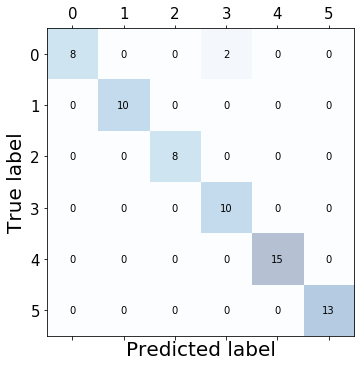

[Precision]
Individual: 1.00, 1.00, 1.00
Micro: 0.97
Macro: 0.97

[Recall]
Individual: 0.80, 1.00, 1.00
Micro: 0.97
Macro: 0.97

[F1-score]
Individual: 0.89, 1.00, 1.00
Micro: 0.97
Macro: 0.97


In [75]:
print("Testing Accuracy: ", grid_svm.score(X_test, y_test))

y_pred = grid_svm.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### 將Model存起來

In [76]:
joblib.dump(grid_svm.best_estimator_, './classifiers/svm_facenet.pkl')

['./Model/svm_facenet.pkl']

### Random Forest做預測 (with FaceNet embedding)

In [77]:
param_grid = [{'n_estimators': range(1, 100, 5),
              'criterion': ['gini', 'entropy']}]

rf = RandomForestClassifier()
grid_rf = GridSearchCV(estimator=rf, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_rf = grid_rf.fit(X_train, y_train)

print(grid_rf.best_score_)
print(grid_rf.best_params_)

0.9711864406779661
{'n_estimators': 71, 'criterion': 'gini'}


Testing Accuracy:  0.9696969696969697


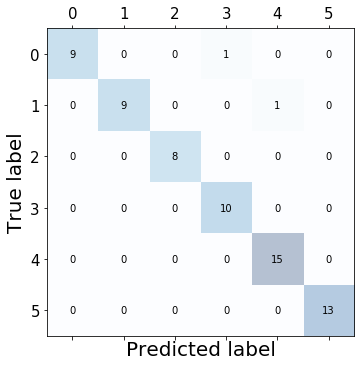

[Precision]
Individual: 1.00, 1.00, 1.00
Micro: 0.97
Macro: 0.97

[Recall]
Individual: 0.90, 0.90, 1.00
Micro: 0.97
Macro: 0.97

[F1-score]
Individual: 0.95, 0.95, 1.00
Micro: 0.97
Macro: 0.97


In [78]:
print("Testing Accuracy: ", grid_rf.score(X_test, y_test))

y_pred = grid_rf.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

In [79]:
joblib.dump(grid_rf.best_estimator_, './classifiers/rf_facenet.pkl')

['./Model/rf_facenet.pkl']

### KNN 去判斷 (with FaceNet embedding)

In [80]:
param_grid = [{'n_neighbors': range(1, 15)}]

knn = KNeighborsClassifier()
grid_knn = GridSearchCV(estimator=knn, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_knn = grid_knn.fit(X_train, y_train)

print(grid_knn.best_score_)
print(grid_knn.best_params_)

0.9559322033898305
{'n_neighbors': 1}


Testing Accuracy:  0.9545454545454546


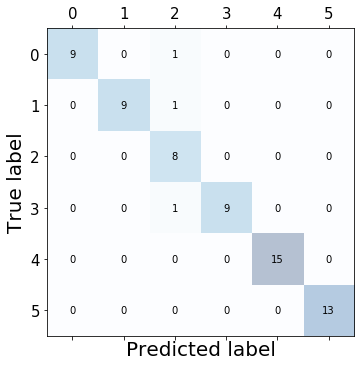

[Precision]
Individual: 1.00, 1.00, 0.73
Micro: 0.95
Macro: 0.95

[Recall]
Individual: 0.90, 0.90, 1.00
Micro: 0.95
Macro: 0.95

[F1-score]
Individual: 0.95, 0.95, 0.84
Micro: 0.95
Macro: 0.95


In [81]:
print("Testing Accuracy: ", grid_knn.score(X_test, y_test))

y_pred = grid_knn.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

In [82]:
joblib.dump(grid_knn.best_estimator_, './classifiers/knn_facenet.pkl')

['./Model/knn_facenet.pkl']

## 選擇使用 OpenFace Embedding (Optional)

In [83]:
X = X_openface
y = y_openface

le = LabelEncoder()
y_val = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_val, test_size=0.3, random_state=1, stratify=y_val)

In [84]:
list(le.inverse_transform([0,1,2,3,4,5]))

['Donald Trump',
 'Emma_Watson',
 'Hsi-Pin_Ma',
 'Kuo-Yu_Han',
 'Max_Hsu',
 'Michael_Chu']

### SVM做預測 (with OpenFace embedding)

In [85]:
param_grid = [{'C': [1e3, 5e3, 1e4, 5e4, 1e5],
              'gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1]}]

grid_svm = GridSearchCV(estimator=SVC(kernel='rbf'), 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_svm = grid_svm.fit(X_train, y_train)

print(grid_svm.best_score_)
print(grid_svm.best_params_)

0.9956427015250545
{'C': 1000.0, 'gamma': 0.001}


Testing Accuracy:  0.9847715736040609


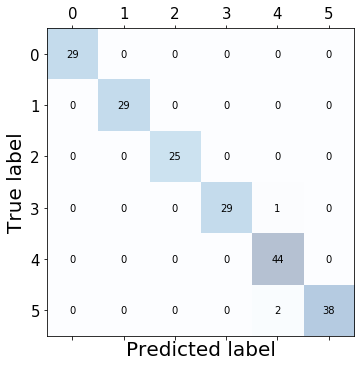

[Precision]
Individual: 1.00, 1.00, 1.00
Micro: 0.98
Macro: 0.99

[Recall]
Individual: 1.00, 1.00, 1.00
Micro: 0.98
Macro: 0.99

[F1-score]
Individual: 1.00, 1.00, 1.00
Micro: 0.98
Macro: 0.99


In [86]:
print("Testing Accuracy: ", grid_svm.score(X_test, y_test))

y_pred = grid_svm.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

#### 將Model存起來

In [87]:
joblib.dump(grid_svm.best_estimator_, './classifiers/svm_openface.pkl')

['./Model/svm_openface.pkl']

### Random Forest 做預測 (with OpenFace embedding)

In [88]:
param_grid = [{'n_estimators': range(1, 100, 5),
              'criterion': ['gini', 'entropy']}]

rf = RandomForestClassifier()
grid_rf = GridSearchCV(estimator=rf, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_rf = grid_rf.fit(X_train, y_train)

print(grid_rf.best_score_)
print(grid_rf.best_params_)

0.9978213507625272
{'n_estimators': 31, 'criterion': 'gini'}


Testing Accuracy:  0.9898477157360406


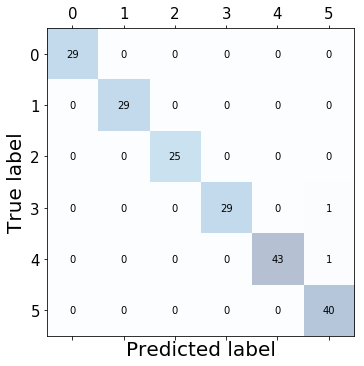

[Precision]
Individual: 1.00, 1.00, 1.00
Micro: 0.99
Macro: 0.99

[Recall]
Individual: 1.00, 1.00, 1.00
Micro: 0.99
Macro: 0.99

[F1-score]
Individual: 1.00, 1.00, 1.00
Micro: 0.99
Macro: 0.99


In [89]:
print("Testing Accuracy: ", grid_rf.score(X_test, y_test))

y_pred = grid_rf.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

In [90]:
joblib.dump(grid_rf.best_estimator_, './classifiers/rf_openface.pkl')

['./Model/rf_openface.pkl']

### KNN 去判斷 (with OpenFace embedding)

In [91]:
param_grid = [{'n_neighbors': range(1, 15)}]

knn = KNeighborsClassifier()
grid_knn = GridSearchCV(estimator=knn, 
                  param_grid=param_grid, 
                  scoring='accuracy',
                  n_jobs=4,
                  cv=5)
grid_knn = grid_knn.fit(X_train, y_train)

print(grid_knn.best_score_)
print(grid_knn.best_params_)

0.9956427015250545
{'n_neighbors': 1}


Testing Accuracy:  0.9847715736040609


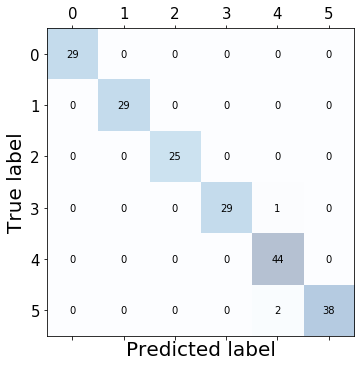

[Precision]
Individual: 1.00, 1.00, 1.00
Micro: 0.98
Macro: 0.99

[Recall]
Individual: 1.00, 1.00, 1.00
Micro: 0.98
Macro: 0.99

[F1-score]
Individual: 1.00, 1.00, 1.00
Micro: 0.98
Macro: 0.99


In [92]:
print("Testing Accuracy: ", grid_knn.score(X_test, y_test))

y_pred = grid_knn.predict(X_test)
plot_confusion_matrix(y_test, y_pred)
scoring_matrix(y_test, y_pred)

In [93]:
joblib.dump(grid_knn.best_estimator_, './classifiers/knn_openface.pkl')

['./Model/knn_openface.pkl']

# 實作 Webcam 的即時辨識功能

In [97]:
import cv2

# 引入該用的臉部擷取物件
print("\n Preparing for face detection module ......")
predictor_model = "./face predictors/shape_predictor_68_face_landmarks.dat"
face_detector = dlib.get_frontal_face_detector()                      # 抓出臉孔
face_pose_predictor = dlib.shape_predictor(predictor_model)           # 抓出臉孔輪廓
face_aligner = openface.AlignDlib(predictor_model)                    # 將臉孔輪廓對齊

# 引入壓縮向量的 CNN Model (FaceNet)
# print("\n Loading FaceNet Model ......")
# face_model = InceptionResNetV1()
# face_model.load_weights('facenet_keras_weights.h5')

# 引入壓縮向量的 CNN Model (OpenFace)
print("\n Loading OpenFace Model ......")
openface_model = create_model()
openface_model.load_weights('./pretrained models/nn4.small2.v1.h5')

print("\n Loading Completed!")

# 引入Classifier
print("\n Loading classification ......")
classifier = joblib.load('./classifiers/svm_openface.pkl')
label_encoder = joblib.load('./classifiers/label_encoder.pkl')


 Preparing for face detection module ......

 Loading OpenFace Model ......

 Loading Completed!

 Loading classification ......


### 使用 Classification Model 去做辨識

In [101]:
# 開啟相機
print("\n Opening Webcam ......")
video_capture = cv2.VideoCapture(0)

# 設定擷取影像的尺寸大小
video_capture.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
video_capture.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)

# 若沒有打開, 則打開
if (not video_capture.isOpened()):
    video_capture.open()

while True:
    ret, frame = video_capture.read()
    cv2.imshow('Video', frame)
    
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # 用 face_detector 去找出臉孔位置及特徵
    detected_faces = face_detector(image, 1)

    # 處理每個臉孔的資料
    for face_rect in detected_faces:
        
        # print(face_rect)
        
        # 抓取臉孔資訊並壓縮成 128 維度的向量
        pose_landmarks = face_pose_predictor(image, face_rect)
        alignedFace = face_aligner.align(96, image, face_rect, landmarkIndices=openface.AlignDlib.OUTER_EYES_AND_NOSE)
        norm_alignedFace = cv2.normalize(alignedFace, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        norm_alignedFace = norm_alignedFace[np.newaxis]
        face_description = openface_model.predict(norm_alignedFace)
        
        # 用 Classifier 去辨認是誰
        y_out = classifier.predict(face_description)
        predict_name = label_encoder.inverse_transform([y_out])
        
        # 畫出辨認的框框 
        x1 = face_rect.left()
        y1 = face_rect.top()
        x2 = face_rect.right()
        y2 = face_rect.bottom()
        cv2.rectangle(frame, (x1, y1), (x2, y2), (80,18,236), 2)
        cv2.rectangle(frame, (x1, y2 - 30), (x2, y2), (80,18,236), cv2.FILLED)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame, str(predict_name), (x1 + 10, y2 - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        
    cv2.imshow('Video', frame)
    
    # 按下 'q' 鍵可以關閉 WebCam
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

print("\n Closing Windows ......")
# 釋放所有資源
video_capture.release()
cv2.destroyAllWindows()
print("\n Window Successfully Closed!")


 Opening Webcam ......

 Closing Windows ......

 Window Successfully Closed!


### 問題 : Classification Model 不該分辨出不在 Dataset 內部的人
#### 先測試 matched pair 和 non-matched pair 之間的 L2 Distance 大概是多少, 將該值定為 Threshold

In [114]:
name_labels = np.unique(y_openface)
print(name_labels)

for i, name in enumerate(name_labels):
    
    same_indices = [idx for idx, x in enumerate(y_openface.to_numpy()) if x == name]
    diff_indices = [idx for idx, x in enumerate(y_openface.to_numpy()) if x != name]
    
    print("\n", name, "comparing others ......")
    
    same_dist = np.mean(np.sum(np.square(X_openface.to_numpy()[same_indices[0]:same_indices[-1], :] - X_openface.to_numpy()[i, :]), axis=1), axis=0)
    diff_dist = np.mean(np.sum(np.square(X_openface.to_numpy()[diff_indices[0]:diff_indices[-1], :] - X_openface.to_numpy()[i, :]), axis=1), axis=0)
    
    print("    Same Person Distance: ", same_dist)
    print("    Different Person Distance: ", diff_dist)

['Donald Trump' 'Emma_Watson' 'Hsi-Pin_Ma' 'Kuo-Yu_Han' 'Max_Hsu'
 'Michael_Chu']

 Donald Trump comparing others ......
    Same Person Distance:  1.9222706506639948
    Different Person Distance:  1.0345875215017706

 Emma_Watson comparing others ......
    Same Person Distance:  2.373889270234917
    Different Person Distance:  0.9885922292285888

 Hsi-Pin_Ma comparing others ......
    Same Person Distance:  0.9305229367239669
    Different Person Distance:  1.1174389347376688

 Kuo-Yu_Han comparing others ......
    Same Person Distance:  0.4629687987458896
    Different Person Distance:  1.03916195792813

 Max_Hsu comparing others ......
    Same Person Distance:  0.3263808221788923
    Different Person Distance:  1.154272202328864

 Michael_Chu comparing others ......
    Same Person Distance:  0.9603873472098907
    Different Person Distance:  1.242083079552307


### 使用 L2 Distance 去做辨認 (可以避免非 Dataset 的人被誤認)

In [115]:
# 開啟相機
print("\n Opening Webcam ......")
video_capture = cv2.VideoCapture(0)

# 設定擷取影像的尺寸大小
video_capture.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
video_capture.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)

# 若沒有打開, 則打開
if (not video_capture.isOpened()):
    video_capture.open()
    
# 設定辨認閾值
threshold = 0.25

y_out = label_encoder.transform(y_facenet)

while True:
    ret, frame = video_capture.read()
    cv2.imshow('Video', frame)
    
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # 用 face_detector 去找出臉孔位置及特徵
    detected_faces = face_detector(image, 1)

    # 處理每個臉孔的資料
    for face_rect in detected_faces:
        
        # print(face_rect)
        
        # 抓取臉孔資訊並壓縮成 128 維度的向量
        pose_landmarks = face_pose_predictor(image, face_rect)
        alignedFace = face_aligner.align(96, image, face_rect, landmarkIndices=openface.AlignDlib.OUTER_EYES_AND_NOSE)
        norm_alignedFace = cv2.normalize(alignedFace, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        norm_alignedFace = norm_alignedFace[np.newaxis]
        face_description = openface_model.predict(norm_alignedFace)
        
        # 用 L2 Distance 去判斷是誰
        diff = np.subtract(X_openface.to_numpy(), face_description)
        dist = np.sum(np.square(diff), axis=1)
        idx = np.argmin(dist)
        #print(dist[idx])
        if dist[idx] < threshold:
            predict_name = label_encoder.inverse_transform([y_out[idx]])
        else:
            predict_name = "Not Detect Anyone!"
        
        # 畫出辨認的框框 
        x1 = face_rect.left()
        y1 = face_rect.top()
        x2 = face_rect.right()
        y2 = face_rect.bottom()
        cv2.rectangle(frame, (x1, y1), (x2, y2), (80,18,236), 2)
        cv2.rectangle(frame, (x1, y2 - 30), (x2, y2), (80,18,236), cv2.FILLED)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame, str(predict_name), (x1 + 10, y2 - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        
    cv2.imshow('Video', frame)
    
    # 按下 'q' 鍵可以關閉 WebCam
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

print("\n Closing Windows ......")
# 釋放所有資源
video_capture.release()
cv2.destroyAllWindows()
print("\n Window Successfully Closed!")


 Opening Webcam ......

 Closing Windows ......

 Window Successfully Closed!


In [100]:
video_capture.release()
cv2.destroyAllWindows()